In [5]:
import torch
import json
import h5py
import numpy as np
from matplotlib.pyplot import imshow
from PIL import Image, ImageDraw
import os

In [6]:
dataset_dir = '/data/scene/sgb/Scene-Graph-Benchmark.pytorch/datasets/vg/'
image_file_path = os.path.join(dataset_dir, 'image_data.json')
vocab_file_path = os.path.join(dataset_dir, 'VG-SGG-dicts.json')
data_file_path = os.path.join(dataset_dir, 'VG-SGG.h5')

image_file = json.load(open(image_file_path))
vocab_file = json.load(open(vocab_file_path))
data_file = h5py.File(data_file_path, 'r')

# remove invalid image
corrupted_ims = [1592, 1722, 4616, 4617]
tmp = []
for item in image_file:
    if int(item['image_id']) not in corrupted_ims:
        tmp.append(item)
image_file = tmp

In [8]:
# load detected results
checkpoint_dir = '/data/scene/sgb/Scene-Graph-Benchmark.pytorch/checkpoints'
checkpoint_name = 'vctree-precls-cross-entropy/inference/VG_stanford_filtered_with_attribute_test/'
detected_origin_path = os.path.join(checkpoint_dir, checkpoint_name)
detected_origin_result = torch.load(detected_origin_path + 'eval_results.pytorch')
detected_info = json.load(open(detected_origin_path + 'visual_info.json'))

In [13]:
# get image info by index
def get_info_by_idx(idx, det_input, thres=0.5):
    groundtruth = det_input['groundtruths'][idx]
    prediction = det_input['predictions'][idx]
    # image path
    img_path = detected_info[idx]['img_file']
    # boxes
    boxes = groundtruth.bbox
    # object labels
    idx2label = vocab_file['idx_to_label']
    labels = ['{}-{}'.format(idx,idx2label[str(i)]) for idx, i in enumerate(groundtruth.get_field('labels').tolist())]
    print('labels:', labels)
    pred_labels = ['{}-{}'.format(idx,idx2label[str(i)]) for idx, i in enumerate(prediction.get_field('pred_labels').tolist())]
    # groundtruth relation triplet
    idx2pred = vocab_file['idx_to_predicate']
    gt_rels = groundtruth.get_field('relation_tuple').tolist()
    gt_rels = [(labels[i[0]], idx2pred[str(i[2])], labels[i[1]]) for i in gt_rels]
    print('gt_rels:', gt_rels)
    # prediction relation triplet
    pred_rel_pair = prediction.get_field('rel_pair_idxs').tolist()
    pred_rel_label = prediction.get_field('pred_rel_scores')
    pred_rel_label[:,0] = 0
    pred_rel_score, pred_rel_label = pred_rel_label.max(-1)
    #mask = pred_rel_score > thres
    #pred_rel_score = pred_rel_score[mask]
    #pred_rel_label = pred_rel_label[mask]
    pred_rels = [(pred_labels[i[0]], idx2pred[str(j)], pred_labels[i[1]]) for i, j in zip(pred_rel_pair, pred_rel_label.tolist())]
    return img_path, boxes, labels, gt_rels, pred_rels, pred_rel_score, pred_rel_label

In [10]:
def draw_single_box(pic, box, color='red', draw_info=None):
    draw = ImageDraw.Draw(pic)
    x1,y1,x2,y2 = int(box[0]), int(box[1]), int(box[2]), int(box[3])
    draw.rectangle(((x1, y1), (x2, y2)), outline=color)
    if draw_info:
        draw.rectangle(((x1, y1), (x1+50, y1+10)), fill=color)
        info = draw_info
        draw.text((x1, y1), info)

def print_list(name, input_list):
    for i, item in enumerate(input_list):
        print(name + ' ' + str(i) + ': ' + str(item))
    
def draw_image(img_path, boxes, labels, gt_rels, pred_rels, pred_rel_score, pred_rel_label, print_img=True):
    pic = Image.open(img_path)
    num_obj = boxes.shape[0]
    for i in range(num_obj):
        info = labels[i]
        draw_single_box(pic, boxes[i], draw_info=info)
    if print_img:
        display(pic)
    if print_img:
        print('*' * 50)
        print_list('gt_boxes', labels)
        print('*' * 50)
        print_list('gt_rels', gt_rels)
        print('*' * 50)
    print_list('pred_rels', pred_rels[:20])
    print('*' * 50)
    
    return None

In [11]:
def show_selected(idx_list):
    for select_idx in idx_list:
        print(select_idx)
        draw_image(*get_info_by_idx(select_idx, detected_origin_result))
        
def show_all(start_idx, length):
    for cand_idx in range(start_idx, start_idx+length):
        print(cand_idx)
        draw_image(*get_info_by_idx(cand_idx, detected_origin_result))

0
labels: ['0-door', '1-house', '2-number', '3-pole', '4-train', '5-tree', '6-window', '7-windshield', '8-woman']
gt_rels: [('7-windshield', 'on', '4-train'), ('6-window', 'on', '4-train'), ('4-train', 'has', '6-window'), ('1-house', 'near', '4-train'), ('5-tree', 'near', '1-house')]


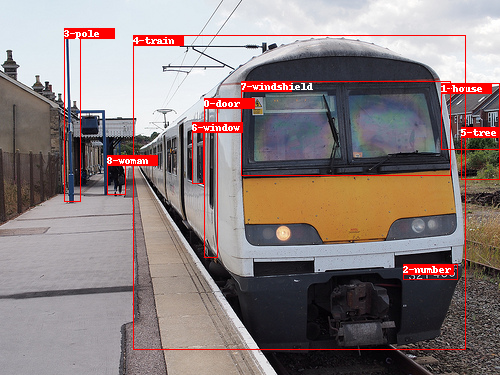

**************************************************
gt_boxes 0: 0-door
gt_boxes 1: 1-house
gt_boxes 2: 2-number
gt_boxes 3: 3-pole
gt_boxes 4: 4-train
gt_boxes 5: 5-tree
gt_boxes 6: 6-window
gt_boxes 7: 7-windshield
gt_boxes 8: 8-woman
**************************************************
gt_rels 0: ('7-windshield', 'on', '4-train')
gt_rels 1: ('6-window', 'on', '4-train')
gt_rels 2: ('4-train', 'has', '6-window')
gt_rels 3: ('1-house', 'near', '4-train')
gt_rels 4: ('5-tree', 'near', '1-house')
**************************************************
pred_rels 0: ('2-number', 'on', '4-train')
pred_rels 1: ('6-window', 'on', '4-train')
pred_rels 2: ('7-windshield', 'on', '4-train')
pred_rels 3: ('0-door', 'on', '4-train')
pred_rels 4: ('4-train', 'has', '0-door')
pred_rels 5: ('4-train', 'has', '7-windshield')
pred_rels 6: ('4-train', 'has', '2-number')
pred_rels 7: ('4-train', 'has', '6-window')
pred_rels 8: ('1-house', 'behind', '4-train')
pred_rels 9: ('5-tree', 'behind', '4-train')
pred_rels

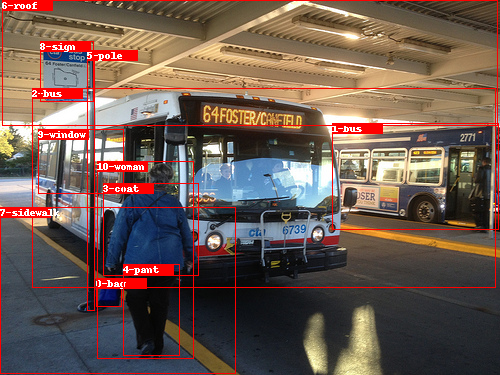

**************************************************
gt_boxes 0: 0-bag
gt_boxes 1: 1-bus
gt_boxes 2: 2-bus
gt_boxes 3: 3-coat
gt_boxes 4: 4-pant
gt_boxes 5: 5-pole
gt_boxes 6: 6-roof
gt_boxes 7: 7-sidewalk
gt_boxes 8: 8-sign
gt_boxes 9: 9-window
gt_boxes 10: 10-woman
**************************************************
gt_rels 0: ('2-bus', 'under', '6-roof')
gt_rels 1: ('10-woman', 'near', '2-bus')
gt_rels 2: ('9-window', 'on', '2-bus')
gt_rels 3: ('10-woman', 'wearing', '3-coat')
**************************************************
pred_rels 0: ('8-sign', 'on', '5-pole')
pred_rels 1: ('10-woman', 'wearing', '3-coat')
pred_rels 2: ('10-woman', 'wearing', '4-pant')
pred_rels 3: ('9-window', 'on', '2-bus')
pred_rels 4: ('10-woman', 'on', '7-sidewalk')
pred_rels 5: ('6-roof', 'above', '2-bus')
pred_rels 6: ('5-pole', 'on', '7-sidewalk')
pred_rels 7: ('10-woman', 'has', '0-bag')
pred_rels 8: ('2-bus', 'has', '9-window')
pred_rels 9: ('0-bag', 'on', '7-sidewalk')
pred_rels 10: ('8-sign', 'on', '6

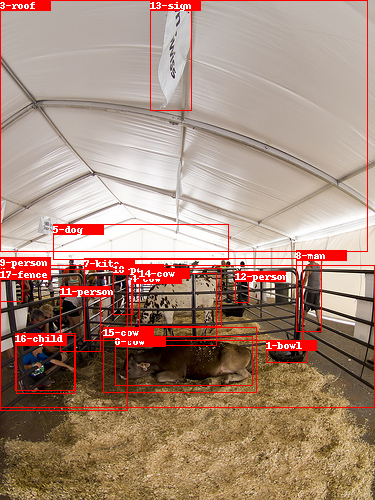

**************************************************
gt_boxes 0: 0-cow
gt_boxes 1: 1-bowl
gt_boxes 2: 2-boy
gt_boxes 3: 3-roof
gt_boxes 4: 4-cow
gt_boxes 5: 5-dog
gt_boxes 6: 6-fence
gt_boxes 7: 7-kite
gt_boxes 8: 8-man
gt_boxes 9: 9-person
gt_boxes 10: 10-person
gt_boxes 11: 11-person
gt_boxes 12: 12-person
gt_boxes 13: 13-sign
gt_boxes 14: 14-cow
gt_boxes 15: 15-cow
gt_boxes 16: 16-child
gt_boxes 17: 17-fence
**************************************************
gt_rels 0: ('13-sign', 'hanging from', '3-roof')
gt_rels 1: ('6-fence', 'near', '0-cow')
**************************************************
pred_rels 0: ('14-cow', 'on', '7-kite')
pred_rels 1: ('4-cow', 'on', '7-kite')
pred_rels 2: ('13-sign', 'on', '3-roof')
pred_rels 3: ('1-bowl', 'on', '6-fence')
pred_rels 4: ('4-cow', 'behind', '6-fence')
pred_rels 5: ('0-cow', 'behind', '6-fence')
pred_rels 6: ('10-person', 'watching', '14-cow')
pred_rels 7: ('14-cow', 'behind', '6-fence')
pred_rels 8: ('9-person', 'behind', '17-fence')
pred_

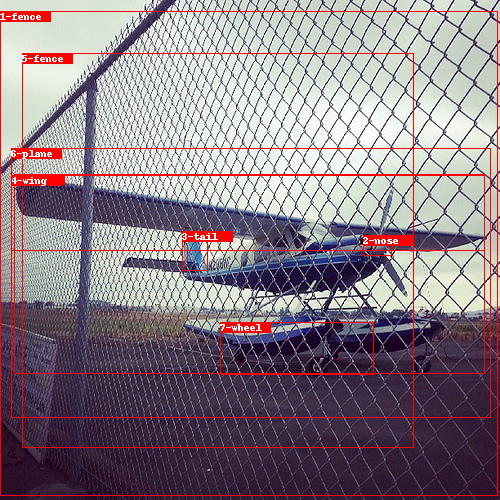

**************************************************
gt_boxes 0: 0-plane
gt_boxes 1: 1-fence
gt_boxes 2: 2-nose
gt_boxes 3: 3-tail
gt_boxes 4: 4-wing
gt_boxes 5: 5-fence
gt_boxes 6: 6-plane
gt_boxes 7: 7-wheel
**************************************************
gt_rels 0: ('4-wing', 'on', '6-plane')
gt_rels 1: ('0-plane', 'has', '3-tail')
gt_rels 2: ('1-fence', 'in front of', '0-plane')
gt_rels 3: ('7-wheel', 'on', '6-plane')
gt_rels 4: ('4-wing', 'on', '0-plane')
**************************************************
pred_rels 0: ('4-wing', 'on', '0-plane')
pred_rels 1: ('4-wing', 'on', '6-plane')
pred_rels 2: ('2-nose', 'of', '0-plane')
pred_rels 3: ('4-wing', 'on', '1-fence')
pred_rels 4: ('0-plane', 'has', '4-wing')
pred_rels 5: ('3-tail', 'of', '0-plane')
pred_rels 6: ('2-nose', 'of', '6-plane')
pred_rels 7: ('7-wheel', 'on', '6-plane')
pred_rels 8: ('3-tail', 'of', '6-plane')
pred_rels 9: ('6-plane', 'has', '4-wing')
pred_rels 10: ('6-plane', 'in', '1-fence')
pred_rels 11: ('0-plane', '

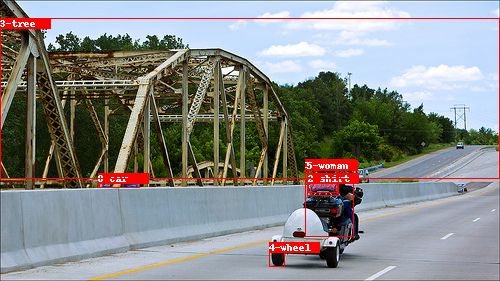

**************************************************
gt_boxes 0: 0-car
gt_boxes 1: 1-people
gt_boxes 2: 2-shirt
gt_boxes 3: 3-tree
gt_boxes 4: 4-wheel
gt_boxes 5: 5-woman
**************************************************
gt_rels 0: ('5-woman', 'wearing', '2-shirt')
gt_rels 1: ('5-woman', 'wearing', '2-shirt')
**************************************************
pred_rels 0: ('5-woman', 'wearing', '2-shirt')
pred_rels 1: ('3-tree', 'behind', '1-people')
pred_rels 2: ('0-car', 'near', '3-tree')
pred_rels 3: ('1-people', 'wearing', '2-shirt')
pred_rels 4: ('2-shirt', 'on', '5-woman')
pred_rels 5: ('1-people', 'under', '3-tree')
pred_rels 6: ('3-tree', 'behind', '5-woman')
pred_rels 7: ('0-car', 'near', '1-people')
pred_rels 8: ('3-tree', 'near', '0-car')
pred_rels 9: ('5-woman', 'in', '1-people')
pred_rels 10: ('5-woman', 'near', '3-tree')
pred_rels 11: ('1-people', 'has', '5-woman')
pred_rels 12: ('0-car', 'behind', '5-woman')
pred_rels 13: ('2-shirt', 'on', '1-people')
pred_rels 14: ('4-wh

In [14]:
show_all(start_idx=0, length=5)
#show_selected([119, 967, 713, 5224, 19681, 25371])

In [33]:
       
# get image info by index
def get_gt_info_by_idx(idx, det_input, thres=0.5):
    groundtruth = det_input['groundtruths'][idx]
    # image path
    img_path = detected_info[idx]['img_file']
    # boxes
    boxes = groundtruth.bbox
    # object labels
    idx2label = vocab_file['idx_to_label']
    labels = ['{}-{}'.format(idx,idx2label[str(i)]) for idx, i in enumerate(groundtruth.get_field('labels').tolist())]
    # print('labels:', labels)
    # groundtruth relation triplet
    idx2pred = vocab_file['idx_to_predicate']
    gt_rels = groundtruth.get_field('relation_tuple').tolist()
    gt_rels = [(labels[i[0]], idx2pred[str(i[2])], labels[i[1]]) for i in gt_rels]
    # print('gt_rels:', gt_rels)
   
    return img_path, labels, gt_rels

# def show_all(start_idx, length):
#     for cand_idx in range(start_idx, start_idx+length):
#         print(cand_idx)
#         get_gt_info_by_idx(cand_idx, detected_origin_result)

# Function to accumulate and save gt_rels
def save_gt_rels(start_idx, length, csv_file_path):
    all_gt_rels = []
    for cand_idx in range(start_idx, start_idx + length):
        _, _, gt_rels = get_gt_info_by_idx(cand_idx, detected_origin_result)
        for rel in gt_rels:
            all_gt_rels.append([cand_idx] + list(rel))  # Including the image index for reference

    # Convert to DataFrame and save to CSV
    df = pd.DataFrame(all_gt_rels, columns=['image_index', 'subject', 'predicate', 'object'])
    df.to_csv(csv_file_path, index=False)

In [29]:
import pandas as pd
# Reusing the given relationships for saving to CSV
gt_rels = [
    ('7-windshield', 'on', '4-train'), 
    ('6-window', 'on', '4-train'), 
    ('4-train', 'has', '6-window'), 
    ('1-house', 'near', '4-train'), 
    ('5-tree', 'near', '1-house')
]

# Convert the relationships to a DataFrame
df_rels = pd.DataFrame(gt_rels, columns=['subject', 'predicate', 'object'])

# Saving the DataFrame to a CSV file
csv_file_path = 'gt_relationships.csv'
df_rels.to_csv(csv_file_path, index=False)

In [56]:
csv_file_path = 'gt_relationships.csv'
save_gt_rels(0, 26445, csv_file_path)

labels: ['0-door', '1-house', '2-number', '3-pole', '4-train', '5-tree', '6-window', '7-windshield', '8-woman']
gt_rels: [('7-windshield', 'on', '4-train'), ('6-window', 'on', '4-train'), ('4-train', 'has', '6-window'), ('1-house', 'near', '4-train'), ('5-tree', 'near', '1-house')]
labels: ['0-bag', '1-bus', '2-bus', '3-coat', '4-pant', '5-pole', '6-roof', '7-sidewalk', '8-sign', '9-window', '10-woman']
gt_rels: [('2-bus', 'under', '6-roof'), ('10-woman', 'near', '2-bus'), ('9-window', 'on', '2-bus'), ('10-woman', 'wearing', '3-coat')]
labels: ['0-cow', '1-bowl', '2-boy', '3-roof', '4-cow', '5-dog', '6-fence', '7-kite', '8-man', '9-person', '10-person', '11-person', '12-person', '13-sign', '14-cow', '15-cow', '16-child', '17-fence']
gt_rels: [('13-sign', 'hanging from', '3-roof'), ('6-fence', 'near', '0-cow')]
labels: ['0-plane', '1-fence', '2-nose', '3-tail', '4-wing', '5-fence', '6-plane', '7-wheel']
gt_rels: [('4-wing', 'on', '6-plane'), ('0-plane', 'has', '3-tail'), ('1-fence', 'in

gt_rels: [('19-person', 'has', '7-hair'), ('9-man', 'wearing', '20-shirt'), ('13-man', 'wearing', '4-glass'), ('14-person', 'has', '0-hair'), ('14-person', 'wearing', '16-shirt'), ('12-man', 'wearing', '15-shirt'), ('13-man', 'wearing', '4-glass'), ('14-person', 'holding', '3-fork'), ('11-man', 'wearing', '24-shirt'), ('10-man', 'wearing', '25-shirt'), ('9-man', 'wearing', '20-shirt'), ('12-man', 'has', '5-hair'), ('26-person', 'wearing', '15-shirt'), ('14-person', 'has', '0-hair'), ('9-man', 'has', '7-hair'), ('13-man', 'has', '8-hair'), ('14-person', 'has', '0-hair'), ('12-man', 'has', '5-hair'), ('9-man', 'has', '29-hair'), ('11-man', 'has', '6-hair'), ('13-man', 'wearing', '30-glass')]
labels: ['0-bottle', '1-person', '2-phone', '3-table', '4-bottle']
gt_rels: [('1-person', 'holding', '2-phone'), ('0-bottle', 'on', '3-table'), ('0-bottle', 'on', '3-table')]
labels: ['0-food', '1-sign', '2-door', '3-glass', '4-letter', '5-light', '6-stand', '7-paper', '8-shelf', '9-table', '10-sign'

gt_rels: [('5-person', 'of', '2-girl'), ('2-girl', 'in front of', '8-sink'), ('5-person', 'wearing', '6-shirt')]
labels: ['0-snow', '1-arm', '2-arm', '3-coat', '4-glass', '5-glove', '6-hair', '7-hand', '8-hand', '9-head', '10-hill', '11-leg', '12-pant', '13-person', '14-ski', '15-ski', '16-tree']
gt_rels: [('13-person', 'has', '6-hair'), ('13-person', 'wearing', '3-coat'), ('13-person', 'wearing', '12-pant'), ('16-tree', 'behind', '13-person'), ('16-tree', 'covered in', '0-snow'), ('0-snow', 'on', '10-hill'), ('13-person', 'has', '9-head'), ('13-person', 'has', '8-hand'), ('13-person', 'has', '7-hand'), ('13-person', 'has', '11-leg'), ('13-person', 'has', '11-leg'), ('13-person', 'wearing', '4-glass'), ('13-person', 'has', '1-arm'), ('13-person', 'has', '2-arm'), ('13-person', 'wearing', '3-coat'), ('13-person', 'wearing', '4-glass'), ('13-person', 'in', '0-snow'), ('13-person', 'wearing', '5-glove'), ('13-person', 'on', '10-hill'), ('16-tree', 'growing on', '10-hill'), ('10-hill', 'co

labels: ['0-building', '1-building', '2-car', '3-car', '4-car', '5-car', '6-car', '7-car', '8-light', '9-light', '10-man', '11-person', '12-person', '13-pole', '14-screen', '15-sidewalk', '16-train', '17-tree', '18-tree', '19-tree', '20-window', '21-window', '22-train', '23-window', '24-window', '25-person', '26-street', '27-people']
gt_rels: [('21-window', 'on', '16-train'), ('23-window', 'on', '16-train'), ('24-window', 'on', '16-train'), ('8-light', 'on', '13-pole'), ('3-car', 'has', '14-screen'), ('25-person', 'on', '15-sidewalk'), ('20-window', 'on', '1-building'), ('4-car', 'at', '8-light'), ('4-car', 'at', '8-light'), ('7-car', 'at', '8-light'), ('3-car', 'at', '8-light'), ('2-car', 'at', '8-light'), ('5-car', 'at', '8-light'), ('6-car', 'at', '8-light'), ('25-person', 'on', '15-sidewalk'), ('11-person', 'on', '15-sidewalk'), ('12-person', 'on', '15-sidewalk'), ('27-people', 'on', '15-sidewalk')]
labels: ['0-basket', '1-banana', '2-basket', '3-bike', '4-bike', '5-person', '6-hea

labels: ['0-building', '1-man', '2-window', '3-window', '4-window', '5-window', '6-window', '7-window', '8-window', '9-window', '10-window']
gt_rels: [('4-window', 'on', '0-building'), ('9-window', 'on', '0-building'), ('4-window', 'on', '0-building'), ('8-window', 'on', '0-building'), ('8-window', 'on', '0-building'), ('7-window', 'on', '0-building'), ('2-window', 'on', '0-building'), ('9-window', 'on', '0-building'), ('10-window', 'on', '0-building'), ('5-window', 'on', '0-building')]
labels: ['0-logo', '1-track', '2-train', '3-tree', '4-windshield']
gt_rels: [('2-train', 'near', '3-tree'), ('0-logo', 'painted on', '2-train'), ('2-train', 'on', '1-track')]
labels: ['0-branch', '1-helmet', '2-light', '3-motorcycle', '4-snow', '5-snow', '6-tree', '7-truck', '8-person']
gt_rels: [('5-snow', 'on', '4-snow'), ('5-snow', 'on', '4-snow'), ('8-person', 'riding', '3-motorcycle'), ('5-snow', 'on', '0-branch'), ('8-person', 'sitting on', '3-motorcycle')]
labels: ['0-clock', '1-building', '2-clo

labels: ['0-bench', '1-boy', '2-clock', '3-pole', '4-pole', '5-sidewalk', '6-sidewalk', '7-tile', '8-tree', '9-tree', '10-tree', '11-tree', '12-tree', '13-pole']
gt_rels: [('2-clock', 'above', '4-pole'), ('11-tree', 'growing on', '10-tree'), ('8-tree', 'growing on', '10-tree'), ('8-tree', 'growing on', '10-tree'), ('12-tree', 'growing on', '10-tree'), ('9-tree', 'growing on', '10-tree'), ('2-clock', 'on', '13-pole'), ('2-clock', 'on', '13-pole'), ('2-clock', 'on', '4-pole'), ('13-pole', 'with', '2-clock'), ('2-clock', 'above', '13-pole'), ('0-bench', 'near', '3-pole'), ('1-boy', 'near', '3-pole'), ('4-pole', 'for', '2-clock'), ('6-sidewalk', 'near', '4-pole'), ('9-tree', 'near', '4-pole')]
labels: ['0-chair', '1-man', '2-people', '3-people', '4-person', '5-person', '6-person', '7-person', '8-person', '9-person', '10-person', '11-person', '12-racket', '13-railing', '14-seat', '15-shirt', '16-stand', '17-tree', '18-umbrella', '19-woman', '20-woman', '21-woman', '22-person']
gt_rels: [('3

labels: ['0-beach', '1-board', '2-man', '3-person', '4-surfboard', '5-track', '6-person', '7-surfboard']
gt_rels: [('3-person', 'on', '0-beach'), ('6-person', 'on', '0-beach'), ('5-track', 'on', '0-beach')]
labels: ['0-handle', '1-seat', '2-sign', '3-sign', '4-tile', '5-tile', '6-tile', '7-tile', '8-tile', '9-tile', '10-tile', '11-toilet']
gt_rels: [('11-toilet', 'with', '1-seat')]
labels: ['0-car', '1-sign', '2-tree', '3-truck']
gt_rels: [('2-tree', 'near', '1-sign')]
labels: ['0-building', '1-building', '2-building', '3-pole', '4-sign', '5-window', '6-wire']
gt_rels: [('5-window', 'attached to', '2-building'), ('5-window', 'near', '2-building'), ('4-sign', 'attached to', '3-pole'), ('5-window', 'attached to', '2-building')]
labels: ['0-arm', '1-arm', '2-face', '3-hand', '4-hand', '5-handle', '6-head', '7-person', '8-person', '9-racket', '10-shirt', '11-shirt', '12-short', '13-short', '14-player', '15-woman', '16-woman']
gt_rels: [('6-head', 'of', '8-person'), ('9-racket', 'in', '3-ha

labels: ['0-chair', '1-dog', '2-dog', '3-ear', '4-ear', '5-ear', '6-ear', '7-leg', '8-leg', '9-leg', '10-nose', '11-room', '12-tail', '13-tail', '14-tail', '15-nose']
gt_rels: [('1-dog', 'of', '2-dog'), ('10-nose', 'of', '2-dog'), ('4-ear', 'of', '1-dog'), ('6-ear', 'of', '1-dog'), ('14-tail', 'on', '2-dog'), ('12-tail', 'on', '1-dog'), ('3-ear', 'of', '2-dog'), ('15-nose', 'on', '2-dog'), ('12-tail', 'on', '2-dog'), ('13-tail', 'on', '2-dog')]
labels: ['0-cap', '1-glove', '2-glove', '3-glove', '4-player', '5-player', '6-player', '7-shirt', '8-shoe', '9-sneaker']
gt_rels: [('6-player', 'wearing', '8-shoe')]
labels: ['0-bench', '1-window', '2-cup', '3-leg', '4-post']
gt_rels: [('2-cup', 'on', '1-window')]
labels: ['0-chair', '1-person', '2-pole', '3-shirt', '4-table', '5-table']
gt_rels: [('1-person', 'in', '3-shirt')]
labels: ['0-man', '1-helmet', '2-girl', '3-man', '4-man', '5-man', '6-man', '7-man', '8-pant', '9-people', '10-people', '11-people', '12-person', '13-player', '14-shirt',

labels: ['0-cap', '1-glove', '2-man', '3-pant', '4-shirt', '5-shoe', '6-shoe', '7-sock', '8-sock']
gt_rels: [('2-man', 'wearing', '0-cap'), ('2-man', 'wearing', '0-cap'), ('2-man', 'has', '7-sock'), ('2-man', 'has', '8-sock'), ('2-man', 'has', '1-glove'), ('2-man', 'wearing', '0-cap'), ('2-man', 'has', '1-glove'), ('2-man', 'wearing', '1-glove')]
labels: ['0-horse', '1-man', '2-face', '3-fence', '4-hat', '5-hat', '6-hat', '7-hat', '8-hat', '9-hat', '10-head', '11-horse', '12-leaf', '13-man', '14-shirt', '15-shirt', '16-shirt', '17-shirt', '18-shirt', '19-shirt', '20-short', '21-sign', '22-tail', '23-hat', '24-pant', '25-person', '26-person', '27-person', '28-hat', '29-man', '30-man', '31-man']
gt_rels: [('23-hat', 'on', '10-head'), ('10-head', 'on', '1-man'), ('1-man', 'on', '11-horse'), ('24-pant', 'on', '1-man'), ('5-hat', 'on', '1-man'), ('25-person', 'on', '11-horse'), ('1-man', 'on', '11-horse'), ('25-person', 'on', '11-horse'), ('26-person', 'on', '11-horse'), ('27-person', 'on',

labels: ['0-cap', '1-counter', '2-jacket', '3-man', '4-man', '5-man', '6-person', '7-phone', '8-seat', '9-shirt', '10-shirt']
gt_rels: [('3-man', 'wearing', '10-shirt'), ('3-man', 'holding', '7-phone'), ('6-person', 'on', '8-seat'), ('6-person', 'on', '8-seat'), ('6-person', 'wearing', '2-jacket'), ('3-man', 'holding', '7-phone'), ('5-man', 'wearing', '0-cap')]
labels: ['0-cup', '1-desk', '2-laptop', '3-paper', '4-room', '5-shelf', '6-shelf']
gt_rels: [('2-laptop', 'on', '1-desk'), ('0-cup', 'on', '1-desk')]
labels: ['0-hat', '1-jean', '2-man', '3-man', '4-skateboard', '5-man', '6-pant', '7-man', '8-man']
gt_rels: [('2-man', 'on', '4-skateboard'), ('2-man', 'wearing', '0-hat'), ('5-man', 'wearing', '6-pant'), ('7-man', 'wearing', '1-jean')]
labels: ['0-light', '1-pole', '2-pole', '3-sign', '4-sign', '5-light', '6-pole']
gt_rels: [('3-sign', 'on', '4-sign'), ('5-light', 'on', '2-pole'), ('0-light', 'on', '6-pole'), ('0-light', 'on', '3-sign'), ('4-sign', 'of', '2-pole'), ('4-sign', 'of'

gt_rels: [('2-man', 'wearing', '4-glass'), ('2-man', 'wearing', '0-glass')]
labels: ['0-car', '1-door', '2-light', '3-mountain', '4-plate', '5-tire', '6-truck', '7-wheel', '8-window', '9-windshield']
gt_rels: [('6-truck', 'has', '2-light'), ('6-truck', 'has', '8-window'), ('6-truck', 'has', '5-tire'), ('6-truck', 'has', '1-door'), ('6-truck', 'has', '5-tire'), ('6-truck', 'has', '2-light'), ('6-truck', 'has', '4-plate'), ('6-truck', 'has', '7-wheel'), ('9-windshield', 'on', '6-truck'), ('6-truck', 'has', '2-light'), ('6-truck', 'has', '1-door'), ('6-truck', 'has', '1-door'), ('6-truck', 'has', '4-plate'), ('0-car', 'near', '6-truck'), ('6-truck', 'has', '2-light'), ('6-truck', 'has', '2-light'), ('9-windshield', 'on', '6-truck'), ('6-truck', 'has', '5-tire'), ('6-truck', 'has', '2-light')]
labels: ['0-player', '1-cap', '2-glove', '3-house', '4-house', '5-player', '6-player', '7-player', '8-player', '9-sock', '10-sock', '11-sock', '12-sock', '13-tree', '14-tree', '15-tree', '16-player',

gt_rels: [('15-woman', 'standing on', '13-sidewalk'), ('17-woman', 'wearing', '18-coat'), ('14-sign', 'on', '13-sidewalk'), ('15-woman', 'wearing', '4-glass'), ('15-woman', 'near', '3-building'), ('15-woman', 'wearing', '4-glass'), ('0-person', 'standing on', '13-sidewalk'), ('8-lady', 'has', '6-hair'), ('15-woman', 'wearing', '19-glass'), ('20-woman', 'wearing', '19-glass'), ('0-person', 'wearing', '7-jacket'), ('15-woman', 'wearing', '21-jacket'), ('0-person', 'wearing', '2-boot'), ('0-person', 'wearing', '1-boot')]
labels: ['0-chair', '1-flower', '2-horse', '3-horse', '4-leg', '5-leg', '6-person', '7-person', '8-person', '9-woman', '10-horse', '11-woman', '12-people', '13-horse', '14-woman', '15-person', '16-person', '17-woman']
gt_rels: [('2-horse', 'has', '4-leg'), ('2-horse', 'has', '5-leg'), ('1-flower', 'on', '3-horse'), ('11-woman', 'riding', '3-horse'), ('11-woman', 'on', '3-horse'), ('11-woman', 'riding', '13-horse'), ('14-woman', 'riding', '2-horse'), ('9-woman', 'riding', 

labels: ['0-animal', '1-person', '2-hair', '3-head', '4-head', '5-leaf', '6-leaf', '7-man', '8-man', '9-people', '10-shirt', '11-shirt', '12-sign', '13-sign', '14-sign', '15-sign', '16-towel', '17-window', '18-sign']
gt_rels: [('7-man', 'wears', '10-shirt'), ('8-man', 'wearing', '11-shirt')]
labels: ['0-arm', '1-cap', '2-food', '3-head', '4-man', '5-shirt', '6-woman', '7-people']
gt_rels: [('3-head', 'of', '4-man'), ('0-arm', 'of', '4-man'), ('5-shirt', 'of', '4-man'), ('1-cap', 'on', '4-man'), ('1-cap', 'on', '4-man'), ('1-cap', 'on', '4-man'), ('1-cap', 'on', '6-woman'), ('1-cap', 'on', '4-man'), ('1-cap', 'on', '4-man'), ('1-cap', 'on', '4-man'), ('1-cap', 'on', '4-man'), ('1-cap', 'on', '6-woman')]
labels: ['0-handle', '1-man', '2-umbrella']
gt_rels: [('2-umbrella', 'has', '0-handle'), ('1-man', 'holding', '2-umbrella')]
labels: ['0-car', '1-bus', '2-girl', '3-man', '4-post', '5-sidewalk', '6-sign', '7-sign', '8-street', '9-bus', '10-tire', '11-tree', '12-tree', '13-woman', '14-bus

gt_rels: [('9-man', 'wearing', '10-shirt'), ('13-man', 'sitting on', '1-bench'), ('6-hat', 'on', '7-head'), ('7-head', 'of', '14-man'), ('1-bench', 'near', '16-beach'), ('4-shoe', 'on', '14-man'), ('4-shoe', 'on', '14-man'), ('10-shirt', 'of', '9-man'), ('7-head', 'of', '14-man'), ('14-man', 'has', '3-face'), ('9-man', 'has', '5-hand'), ('14-man', 'has', '4-shoe'), ('14-man', 'has', '0-arm'), ('9-man', 'has', '6-hat'), ('9-man', 'on', '1-bench')]
labels: ['0-building', '1-door', '2-helmet', '3-jacket', '4-jacket', '5-jean', '6-lamp', '7-motorcycle', '8-person', '9-sidewalk', '10-sidewalk', '11-sign', '12-track', '13-window', '14-window', '15-window', '16-window', '17-window', '18-windshield', '19-windshield', '20-windshield', '21-woman', '22-people', '23-bus']
gt_rels: [('22-people', 'in', '7-motorcycle'), ('8-person', 'on', '7-motorcycle'), ('11-sign', 'on', '23-bus'), ('19-windshield', 'on', '23-bus'), ('18-windshield', 'on', '23-bus'), ('20-windshield', 'on', '23-bus')]
labels: ['0-

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




labels: ['0-bike', '1-hair', '2-woman']
gt_rels: [('2-woman', 'on', '0-bike')]
labels: ['0-bottle', '1-bottle', '2-car', '3-child', '4-eye', '5-girl', '6-hair', '7-pizza', '8-pizza', '9-plate', '10-table', '11-girl', '12-kid', '13-eye', '14-plate']
gt_rels: [('3-child', 'has', '13-eye'), ('8-pizza', 'on', '14-plate'), ('5-girl', 'at', '10-table'), ('3-child', 'at', '10-table')]
labels: ['0-building', '1-pole', '2-sidewalk', '3-street', '4-tire', '5-vehicle', '6-window', '7-woman']
gt_rels: [('2-sidewalk', 'near', '3-street'), ('0-building', 'near', '3-street')]
labels: ['0-bird', '1-head', '2-leaf', '3-leaf', '4-plant', '5-plant', '6-plant', '7-plant', '8-plant', '9-plant', '10-rock', '11-tail', '12-tree', '13-wing', '14-wing', '15-rock']
gt_rels: [('8-plant', 'and', '2-leaf'), ('4-plant', 'and', '2-leaf'), ('6-plant', 'and', '3-leaf'), ('12-tree', 'near', '0-bird')]
labels: ['0-jacket', '1-man', '2-motorcycle', '3-person']
gt_rels: [('3-person', 'on', '2-motorcycle'), ('0-jacket', 'o

labels: ['0-door', '1-cabinet', '2-door', '3-dog', '4-door', '5-door', '6-door', '7-cabinet', '8-cabinet']
gt_rels: [('5-door', 'attached to', '7-cabinet'), ('4-door', 'attached to', '1-cabinet'), ('6-door', 'on', '8-cabinet')]
labels: ['0-beach', '1-umbrella', '2-umbrella', '3-umbrella']
gt_rels: [('1-umbrella', 'on', '0-beach'), ('1-umbrella', 'on', '0-beach'), ('2-umbrella', 'on', '0-beach'), ('3-umbrella', 'on', '0-beach')]
labels: ['0-building', '1-jean', '2-man', '3-bike', '4-pole', '5-seat', '6-shirt', '7-truck', '8-wheel', '9-windshield']
gt_rels: [('2-man', 'wearing', '1-jean'), ('8-wheel', 'on', '3-bike'), ('2-man', 'wearing', '6-shirt'), ('9-windshield', 'on', '3-bike'), ('5-seat', 'on', '3-bike'), ('8-wheel', 'of', '3-bike'), ('2-man', 'wearing', '1-jean')]
labels: ['0-counter', '1-hair', '2-jacket', '3-jacket', '4-man', '5-shelf', '6-sign', '7-woman', '8-woman', '9-woman', '10-woman']
gt_rels: [('9-woman', 'in', '3-jacket'), ('8-woman', 'behind', '0-counter')]
labels: ['0-

labels: ['0-boy', '1-boy', '2-boy', '3-boy', '4-building', '5-building', '6-pant', '7-shirt', '8-shirt', '9-tree', '10-tree', '11-tree', '12-tree', '13-tree', '14-tree', '15-tree', '16-boy', '17-child', '18-building', '19-leaf', '20-leaf', '21-tree']
gt_rels: [('17-child', 'behind', '10-tree'), ('8-shirt', 'on', '2-boy'), ('6-pant', 'on', '2-boy'), ('13-tree', 'with', '19-leaf'), ('12-tree', 'on', '20-leaf')]
labels: ['0-bird', '1-chair', '2-chair', '3-girl', '4-towel', '5-umbrella', '6-woman', '7-chair']
gt_rels: [('6-woman', 'on', '2-chair')]
labels: ['0-box', '1-door', '2-bench', '3-building', '4-window', '5-building', '6-door', '7-window']
gt_rels: [('4-window', 'on', '5-building'), ('0-box', 'on', '1-door')]
labels: ['0-engine', '1-plane', '2-tail', '3-wing', '4-plane', '5-nose']
gt_rels: [('2-tail', 'on', '4-plane'), ('0-engine', 'on', '4-plane'), ('5-nose', 'of', '4-plane')]
labels: ['0-building', '1-building', '2-building', '3-building', '4-building', '5-clock', '6-flag', '7-gi

labels: ['0-building', '1-door', '2-sign', '3-post', '4-post', '5-snow', '6-tree', '7-sign', '8-sign']
gt_rels: [('4-post', 'on', '0-building'), ('3-post', 'on', '0-building'), ('5-snow', 'in front of', '8-sign'), ('1-door', 'on', '0-building'), ('2-sign', 'behind', '5-snow'), ('0-building', 'near', '7-sign')]
labels: ['0-plane', '1-engine', '2-people', '3-person', '4-person', '5-tree', '6-person']
gt_rels: [('6-person', 'on', '0-plane'), ('5-tree', 'behind', '0-plane')]
labels: ['0-branch', '1-light', '2-pole', '3-sign', '4-street', '5-tree', '6-tree', '7-tree', '8-tree', '9-tree', '10-tree', '11-tree', '12-light', '13-street', '14-street', '15-tree', '16-tree', '17-sign']
gt_rels: [('12-light', 'above', '13-street'), ('1-light', 'above', '14-street'), ('0-branch', 'of', '15-tree'), ('3-sign', 'above', '4-street')]
labels: ['0-boy', '1-boy', '2-hat', '3-letter', '4-letter', '5-letter', '6-letter', '7-man', '8-paper', '9-person', '10-people', '11-person', '12-person', '13-person', '14-

gt_rels: [('1-cat', 'has', '4-leg'), ('1-cat', 'has', '3-eye'), ('6-paw', 'of', '7-cat'), ('0-pillow', 'under', '7-cat'), ('1-cat', 'has', '5-nose'), ('0-pillow', 'under', '1-cat'), ('9-animal', 'has', '10-eye'), ('1-cat', 'has', '2-ear'), ('6-paw', 'on', '1-cat')]
labels: ['0-counter', '1-door', '2-pizza', '3-pizza', '4-pizza', '5-pizza', '6-pizza', '7-wire', '8-number']
gt_rels: [('3-pizza', 'in', '1-door'), ('2-pizza', 'in', '1-door'), ('7-wire', 'on', '0-counter'), ('3-pizza', 'on', '2-pizza'), ('2-pizza', 'in', '1-door')]
labels: ['0-building', '1-car', '2-light', '3-light', '4-pole', '5-pole', '6-roof', '7-sign', '8-sign', '9-sign', '10-sign', '11-sign', '12-sign', '13-sign', '14-sign', '15-stand', '16-window', '17-window', '18-pole', '19-pole']
gt_rels: [('10-sign', 'on', '15-stand'), ('11-sign', 'on', '5-pole'), ('7-sign', 'on', '4-pole'), ('14-sign', 'on', '18-pole'), ('7-sign', 'on', '19-pole')]
labels: ['0-flower', '1-flower', '2-flower', '3-flower', '4-flower', '5-vase', '6

labels: ['0-bench', '1-boat', '2-boat', '3-boat', '4-railing', '5-street', '6-bench', '7-boat', '8-letter']
gt_rels: [('8-letter', 'on', '2-boat')]
labels: ['0-building', '1-cap', '2-hand', '3-hat', '4-man', '5-shirt', '6-woman', '7-people']
gt_rels: [('6-woman', 'wearing', '3-hat')]
labels: ['0-leg', '1-leg', '2-leg', '3-leg', '4-zebra', '5-zebra', '6-ear', '7-zebra', '8-leg']
gt_rels: [('6-ear', 'of', '4-zebra'), ('0-leg', 'of', '4-zebra'), ('1-leg', 'of', '4-zebra'), ('2-leg', 'on', '7-zebra'), ('3-leg', 'of', '5-zebra'), ('8-leg', 'on', '5-zebra')]
labels: ['0-boat', '1-car', '2-car', '3-car', '4-car', '5-man', '6-people', '7-rock', '8-boat', '9-boat']
gt_rels: [('5-man', 'standing on', '8-boat')]
labels: ['0-arm', '1-arm', '2-arm', '3-arm', '4-arm', '5-face', '6-finger', '7-hand', '8-hand', '9-man', '10-nose', '11-person', '12-person', '13-shirt', '14-woman', '15-person']
gt_rels: [('7-hand', 'on', '9-man'), ('10-nose', 'of', '9-man'), ('15-person', 'has', '6-finger'), ('3-arm', '

gt_rels: [('2-girl', 'wearing', '4-shirt')]
labels: ['0-sink', '1-bottle', '2-door', '3-glass', '4-light', '5-sink', '6-light']
gt_rels: [('6-light', 'above', '5-sink')]
labels: ['0-helmet', '1-plant', '2-shoe', '3-table', '4-towel', '5-toilet']
gt_rels: [('1-plant', 'above', '3-table'), ('3-table', 'holding', '1-plant')]
labels: ['0-box', '1-orange', '2-orange', '3-orange', '4-orange', '5-orange', '6-orange', '7-orange', '8-orange', '9-orange', '10-orange', '11-orange', '12-orange', '13-orange', '14-orange', '15-orange', '16-orange']
gt_rels: [('2-orange', 'in', '0-box'), ('11-orange', 'in', '0-box'), ('3-orange', 'in', '0-box'), ('12-orange', 'in', '0-box'), ('13-orange', 'in', '0-box'), ('14-orange', 'in', '0-box'), ('9-orange', 'in', '0-box'), ('4-orange', 'in', '0-box'), ('5-orange', 'in', '0-box'), ('15-orange', 'in', '0-box'), ('6-orange', 'in', '0-box'), ('2-orange', 'in', '0-box'), ('9-orange', 'in', '0-box'), ('8-orange', 'in', '0-box'), ('10-orange', 'in', '0-box'), ('9-oran

labels: ['0-arm', '1-board', '2-leg', '3-man', '4-wave', '5-wave', '6-surfboard']
gt_rels: [('3-man', 'on', '6-surfboard')]
labels: ['0-building', '1-ear', '2-ear', '3-head', '4-head', '5-zebra', '6-tail', '7-tree', '8-tree', '9-zebra', '10-zebra', '11-zebra', '12-zebra']
gt_rels: [('6-tail', 'of', '9-zebra'), ('2-ear', 'on', '9-zebra'), ('1-ear', 'on', '9-zebra'), ('4-head', 'on', '11-zebra'), ('3-head', 'on', '10-zebra'), ('6-tail', 'on', '9-zebra')]
labels: ['0-glove', '1-helmet', '2-man', '3-pant', '4-person', '5-shirt', '6-shoe', '7-shoe', '8-player']
gt_rels: [('4-person', 'wearing', '3-pant')]
labels: ['0-fork', '1-handle', '2-leaf', '3-leaf', '4-plate', '5-plate', '6-plate', '7-table', '8-vegetable', '9-vegetable', '10-paper', '11-plate', '12-food', '13-table', '14-table']
gt_rels: [('7-table', 'has', '5-plate'), ('7-table', 'has', '4-plate'), ('10-paper', 'under', '4-plate'), ('4-plate', 'on', '11-plate'), ('4-plate', 'of', '12-food'), ('4-plate', 'on', '6-plate'), ('2-leaf', 

labels: ['0-bird', '1-bird', '2-ear', '3-head', '4-sheep', '5-tail', '6-tail']
gt_rels: [('1-bird', 'on', '4-sheep'), ('0-bird', 'on', '4-sheep'), ('4-sheep', 'has', '2-ear'), ('4-sheep', 'has', '2-ear'), ('1-bird', 'on', '4-sheep'), ('0-bird', 'on', '4-sheep'), ('4-sheep', 'has', '3-head'), ('4-sheep', 'has', '2-ear'), ('1-bird', 'on', '4-sheep'), ('0-bird', 'on', '4-sheep'), ('0-bird', 'of', '4-sheep'), ('0-bird', 'standing on', '4-sheep'), ('1-bird', 'on', '4-sheep'), ('1-bird', 'has', '6-tail'), ('0-bird', 'has', '5-tail'), ('4-sheep', 'has', '2-ear'), ('4-sheep', 'has', '2-ear')]
labels: ['0-airplane', '1-mountain', '2-sign', '3-wing']
gt_rels: [('3-wing', 'of', '0-airplane')]
labels: ['0-arm', '1-board', '2-building', '3-building', '4-jean', '5-light', '6-light', '7-man', '8-post', '9-shirt', '10-tree', '11-tree', '12-tree', '13-tree', '14-tree', '15-wheel', '16-window', '17-window', '18-pant', '19-man', '20-man']
gt_rels: [('9-shirt', 'on', '7-man'), ('4-jean', 'on', '7-man'), (

gt_rels: [('5-man', 'wearing', '9-shirt'), ('10-tree', 'with', '4-leaf'), ('11-windshield', 'of', '3-car')]
labels: ['0-man', '1-leg', '2-leg', '3-pant', '4-skateboard', '5-tree', '6-tree', '7-tree', '8-man']
gt_rels: [('0-man', 'riding', '4-skateboard'), ('8-man', 'has', '2-leg'), ('0-man', 'has', '1-leg'), ('0-man', 'riding', '4-skateboard'), ('0-man', 'wears', '3-pant')]
labels: ['0-basket', '1-boy', '2-people', '3-cap', '4-cap', '5-car', '6-fence', '7-head', '8-leaf', '9-man', '10-racket', '11-shirt', '12-shirt', '13-short', '14-short', '15-short', '16-tree', '17-tree', '18-hat', '19-people', '20-basket', '21-shirt', '22-shirt', '23-hat', '24-man']
gt_rels: [('1-boy', 'wears', '12-shirt')]
labels: ['0-tree', '1-person', '2-dog', '3-fence', '4-jacket', '5-sneaker', '6-hat']
gt_rels: [('3-fence', 'behind', '1-person'), ('0-tree', 'behind', '3-fence'), ('1-person', 'in', '6-hat')]
labels: ['0-arm', '1-arm', '2-box', '3-chair', '4-chair', '5-fence', '6-head', '7-head', '8-head', '9-hea

gt_rels: [('10-tree', 'with', '3-branch'), ('12-man', 'sitting on', '13-motorcycle'), ('14-man', 'wearing', '5-jacket'), ('14-man', 'wearing', '6-jean'), ('15-bag', 'on back of', '1-bike'), ('0-bag', 'on back of', '1-bike'), ('8-man', 'sitting on', '13-motorcycle'), ('2-boot', 'on', '8-man')]
labels: ['0-building', '1-car', '2-engine', '3-leaf', '4-man', '5-roof', '6-track', '7-tree', '8-train', '9-engine', '10-track', '11-car']
gt_rels: [('8-train', 'on', '6-track'), ('7-tree', 'with', '3-leaf'), ('7-tree', 'behind', '0-building'), ('8-train', 'on', '10-track'), ('1-car', 'on', '8-train'), ('11-car', 'on', '8-train')]
labels: ['0-car', '1-coat', '2-jacket', '3-jacket', '4-leaf', '5-man', '6-person', '7-person', '8-person', '9-person', '10-shirt', '11-tire', '12-tree', '13-umbrella', '14-window', '15-woman', '16-fence']
gt_rels: [('11-tire', 'on', '0-car'), ('14-window', 'on', '0-car'), ('5-man', 'holding', '13-umbrella'), ('6-person', 'behind', '5-man'), ('9-person', 'behind', '5-man'

gt_rels: [('7-person', 'watching', '0-player'), ('6-person', 'watching', '0-player'), ('11-person', 'watching', '0-player'), ('5-person', 'watching', '0-player'), ('4-people', 'watching', '0-player'), ('0-player', 'wearing', '2-glove'), ('0-player', 'wearing', '1-hand'), ('0-player', 'has', '3-hand'), ('0-player', 'has', '1-hand'), ('0-player', 'has', '3-hand'), ('0-player', 'has', '1-hand')]
labels: ['0-bottle', '1-counter', '2-cup', '3-glass', '4-shelf', '5-shelf', '6-sink']
gt_rels: [('0-bottle', 'on', '1-counter')]
labels: ['0-bird', '1-chair', '2-chair', '3-curtain', '4-desk', '5-lamp', '6-table', '7-window']
gt_rels: [('7-window', 'has', '3-curtain'), ('5-lamp', 'on', '4-desk'), ('3-curtain', 'over', '7-window'), ('1-chair', 'near', '6-table'), ('2-chair', 'near', '7-window')]
labels: ['0-boy', '1-building', '2-car', '3-car', '4-car', '5-coat', '6-girl', '7-head', '8-helmet', '9-jean', '10-person', '11-shirt', '12-sign', '13-skateboard', '14-tree', '15-tree', '16-street', '17-str

labels: ['0-bus', '1-man', '2-person', '3-person', '4-roof', '5-wheel', '6-wheel', '7-window']
gt_rels: [('3-person', 'behind', '0-bus'), ('2-person', 'behind', '0-bus'), ('6-wheel', 'on', '0-bus'), ('5-wheel', 'on', '0-bus'), ('7-window', 'on', '0-bus')]
labels: ['0-beach', '1-boat', '2-engine', '3-man', '4-people', '5-pole', '6-pole', '7-wave', '8-man']
gt_rels: [('2-engine', 'attached to', '1-boat'), ('4-people', 'in', '1-boat'), ('3-man', 'standing on', '1-boat'), ('5-pole', 'attached to', '1-boat'), ('6-pole', 'attached to', '1-boat')]
labels: ['0-track', '1-building', '2-bus', '3-engine', '4-hill', '5-house', '6-train', '7-rock', '8-track', '9-wire', '10-wire', '11-window', '12-train', '13-track', '14-light']
gt_rels: [('11-window', 'on', '2-bus'), ('10-wire', 'above', '0-track'), ('7-rock', 'between', '13-track'), ('7-rock', 'between', '8-track'), ('14-light', 'on', '6-train'), ('1-building', 'near', '6-train'), ('6-train', 'on', '0-track')]
labels: ['0-board', '1-tree', '2-man'

gt_rels: [('9-window', 'of', '1-window'), ('12-sign', 'in', '14-window'), ('15-person', 'walking on', '11-sidewalk'), ('17-man', 'wearing', '0-boot'), ('15-person', 'on', '11-sidewalk'), ('8-man', 'wearing', '10-shoe'), ('0-boot', 'on', '11-sidewalk')]
labels: ['0-giraffe', '1-giraffe', '2-giraffe', '3-hill', '4-tree']
gt_rels: [('2-giraffe', 'behind', '3-hill'), ('1-giraffe', 'under', '4-tree')]
labels: ['0-building', '1-leaf', '2-stand', '3-vase', '4-window']
gt_rels: [('3-vase', 'on', '2-stand'), ('3-vase', 'on', '2-stand'), ('3-vase', 'on', '2-stand'), ('3-vase', 'in front of', '4-window'), ('3-vase', 'behind', '4-window'), ('3-vase', 'behind', '4-window'), ('0-building', 'has', '4-window'), ('3-vase', 'on', '2-stand'), ('3-vase', 'on', '2-stand')]
labels: ['0-building', '1-light', '2-sidewalk', '3-stand', '4-umbrella', '5-umbrella', '6-umbrella', '7-woman', '8-person', '9-light']
gt_rels: [('1-light', 'in', '0-building'), ('9-light', 'in', '0-building')]
labels: ['0-elephant', '1-

gt_rels: [('2-glass', 'in', '4-hand'), ('15-woman', 'with', '3-hair'), ('8-man', 'wearing', '11-shirt'), ('8-man', 'wearing', '14-tie'), ('9-man', 'in', '0-chair'), ('8-man', 'in', '6-jacket')]
labels: ['0-building', '1-car', '2-fence', '3-leaf', '4-leaf', '5-letter', '6-letter', '7-pole', '8-pole', '9-sign', '10-sign', '11-sign', '12-street', '13-tire', '14-tree', '15-tree', '16-tree', '17-tree', '18-wire', '19-pole', '20-street', '21-post', '22-tree']
gt_rels: [('9-sign', 'on', '8-pole'), ('1-car', 'on', '12-street'), ('13-tire', 'on', '1-car'), ('10-sign', 'on', '19-pole'), ('15-tree', 'near', '12-street'), ('16-tree', 'near', '12-street'), ('18-wire', 'near', '7-pole'), ('14-tree', 'has', '4-leaf'), ('11-sign', 'attached to', '7-pole'), ('9-sign', 'attached to', '21-post'), ('7-pole', 'has', '18-wire'), ('17-tree', 'has', '3-leaf'), ('13-tire', 'on', '1-car'), ('9-sign', 'on', '8-pole'), ('5-letter', 'on', '10-sign')]
labels: ['0-curtain', '1-curtain', '2-dog', '3-glass', '4-hair',

labels: ['0-hair', '1-face', '2-man', '3-hair', '4-hair', '5-leaf', '6-mountain', '7-neck', '8-tree', '9-shirt', '10-shirt', '11-snow', '12-snow', '13-tie', '14-tree', '15-tree', '16-tree', '17-tree', '18-tree', '19-tree']
gt_rels: [('13-tie', 'on', '2-man'), ('2-man', 'wearing', '10-shirt'), ('16-tree', 'on', '6-mountain'), ('2-man', 'has', '3-hair'), ('2-man', 'has', '0-hair'), ('13-tie', 'on', '7-neck')]
labels: ['0-bag', '1-chair', '2-chair', '3-chair', '4-chair', '5-flower', '6-flower', '7-lamp', '8-lamp', '9-light', '10-light', '11-light', '12-light', '13-people', '14-person', '15-table', '16-table', '17-track', '18-window', '19-table', '20-light', '21-light', '22-paper', '23-chair', '24-chair', '25-woman', '26-chair']
gt_rels: [('2-chair', 'at', '19-table'), ('22-paper', 'on', '16-table'), ('5-flower', 'on', '16-table'), ('25-woman', 'carrying', '0-bag'), ('26-chair', 'at', '16-table'), ('14-person', 'at', '15-table')]
labels: ['0-fence', '1-fence', '2-fence', '3-fence', '4-woma

labels: ['0-door', '1-fence', '2-sidewalk', '3-sign', '4-street', '5-tire', '6-tire', '7-tire', '8-tree', '9-truck', '10-window', '11-light', '12-tire', '13-plate', '14-windshield']
gt_rels: [('11-light', 'on', '9-truck'), ('9-truck', 'has', '12-tire'), ('9-truck', 'has', '5-tire'), ('9-truck', 'has', '6-tire'), ('9-truck', 'has', '7-tire'), ('10-window', 'on', '9-truck'), ('8-tree', 'near', '9-truck'), ('13-plate', 'on', '9-truck'), ('0-door', 'on', '9-truck'), ('2-sidewalk', 'across', '4-street'), ('3-sign', 'on', '9-truck')]
labels: ['0-table', '1-curtain', '2-curtain', '3-curtain', '4-curtain', '5-laptop', '6-paper', '7-paper', '8-pillow', '9-window', '10-pillow', '11-paper']
gt_rels: [('2-curtain', 'covering', '9-window'), ('11-paper', 'on', '0-table'), ('7-paper', 'on', '0-table')]
labels: ['0-chair', '1-hand', '2-man', '3-man', '4-pant', '5-people', '6-person', '7-person', '8-person', '9-pillow', '10-pillow', '11-tie', '12-woman', '13-woman', '14-woman', '15-shirt', '16-shirt', 

labels: ['0-arm', '1-leg', '2-man', '3-man', '4-pant', '5-train', '6-wheel', '7-wheel', '8-window', '9-window', '10-window', '11-window', '12-window', '13-man', '14-train', '15-wheel', '16-man', '17-person', '18-person']
gt_rels: [('15-wheel', 'of', '5-train'), ('7-wheel', 'of', '5-train'), ('6-wheel', 'of', '5-train'), ('15-wheel', 'on', '5-train'), ('7-wheel', 'on', '5-train'), ('6-wheel', 'on', '5-train'), ('8-window', 'of', '5-train'), ('17-person', 'looking at', '5-train'), ('10-window', 'attached to', '5-train'), ('9-window', 'attached to', '5-train'), ('11-window', 'attached to', '5-train'), ('12-window', 'attached to', '5-train'), ('0-arm', 'attached to', '17-person')]
labels: ['0-tower', '1-train', '2-tree', '3-window', '4-window']
gt_rels: [('1-train', 'has', '3-window'), ('1-train', 'has', '4-window'), ('3-window', 'on', '1-train')]
labels: ['0-hand', '1-handle', '2-helmet', '3-jean', '4-man', '5-shirt', '6-shoe', '7-shoe', '8-person']
gt_rels: [('8-person', 'wearing', '2-he

labels: ['0-bag', '1-bag', '2-bag', '3-bag', '4-bench', '5-head', '6-helmet', '7-jacket', '8-jacket', '9-jacket', '10-jacket', '11-man', '12-pant', '13-pole', '14-pole', '15-shirt', '16-shirt', '17-sock', '18-sock', '19-man', '20-man', '21-man', '22-sock', '23-player', '24-player', '25-helmet', '26-bench', '27-man', '28-shirt', '29-man', '30-man', '31-glove']
gt_rels: [('21-man', 'wearing', '7-jacket'), ('20-man', 'wearing', '22-sock'), ('20-man', 'wearing', '18-sock'), ('25-helmet', 'on', '5-head'), ('20-man', 'wears', '25-helmet'), ('27-man', 'with', '28-shirt'), ('29-man', 'with', '15-shirt')]
labels: ['0-child', '1-ear', '2-face', '3-finger', '4-hair', '5-hand', '6-head', '7-shirt', '8-woman', '9-logo', '10-logo', '11-mouth', '12-nose', '13-number', '14-people']
gt_rels: [('8-woman', 'has', '2-face'), ('10-logo', 'on', '7-shirt'), ('13-number', 'on', '7-shirt'), ('4-hair', 'in front of', '1-ear'), ('0-child', 'behind', '8-woman'), ('6-head', 'of', '8-woman'), ('1-ear', 'of', '8-wom

labels: ['0-man', '1-mountain', '2-pant', '3-pole', '4-ski', '5-snow', '6-track', '7-tree', '8-snow']
gt_rels: [('2-pant', 'of', '0-man'), ('1-mountain', 'covered in', '5-snow'), ('0-man', 'with', '3-pole'), ('0-man', 'wearing', '2-pant'), ('7-tree', 'on', '1-mountain'), ('0-man', 'holding', '3-pole'), ('7-tree', 'in', '1-mountain'), ('0-man', 'on', '4-ski'), ('4-ski', 'on', '0-man'), ('0-man', 'in', '2-pant')]
labels: ['0-seat', '1-hair', '2-table', '3-toilet', '4-toilet']
gt_rels: [('0-seat', 'on', '4-toilet'), ('3-toilet', 'with', '0-seat')]
labels: ['0-cat', '1-ear', '2-ear', '3-eye', '4-eye', '5-nose', '6-paw']
gt_rels: [('0-cat', 'has', '6-paw'), ('0-cat', 'has', '4-eye'), ('0-cat', 'has', '3-eye'), ('0-cat', 'has', '5-nose'), ('0-cat', 'has', '2-ear'), ('0-cat', 'has', '1-ear'), ('0-cat', 'has', '2-ear'), ('0-cat', 'has', '1-ear'), ('0-cat', 'has', '4-eye'), ('0-cat', 'has', '2-ear'), ('0-cat', 'has', '3-eye')]
labels: ['0-car', '1-car', '2-letter', '3-sidewalk', '4-window']
gt_

gt_rels: [('0-bird', 'on', '1-building'), ('0-bird', 'has', '2-head'), ('0-bird', 'has', '2-head'), ('0-bird', 'has', '3-tail'), ('0-bird', 'has', '3-tail'), ('0-bird', 'has', '4-wing'), ('0-bird', 'in', '1-building'), ('0-bird', 'in', '1-building'), ('0-bird', 'has', '2-head'), ('0-bird', 'has', '2-head'), ('0-bird', 'has', '3-tail'), ('0-bird', 'has', '3-tail'), ('0-bird', 'on', '1-building'), ('0-bird', 'on', '1-building'), ('1-building', 'behind', '0-bird'), ('0-bird', 'has', '3-tail'), ('0-bird', 'on', '1-building'), ('1-building', 'behind', '0-bird'), ('0-bird', 'has', '3-tail')]
labels: ['0-food', '1-plate', '2-table']
gt_rels: [('0-food', 'on', '1-plate'), ('0-food', 'on', '1-plate')]
labels: ['0-door', '1-door', '2-train', '3-jacket', '4-lamp', '5-man', '6-pant', '7-pole', '8-sign', '9-track', '10-track', '11-track', '12-tree', '13-window', '14-windshield', '15-windshield', '16-train', '17-man', '18-train']
gt_rels: [('8-sign', 'on', '7-pole'), ('15-windshield', 'on', '2-train

labels: ['0-boat', '1-boat', '2-house', '3-man', '4-tree', '5-people', '6-building', '7-tree', '8-boat']
gt_rels: [('5-people', 'in', '0-boat'), ('5-people', 'in', '0-boat')]
labels: ['0-jacket', '1-boat', '2-boat', '3-coat', '4-cup', '5-cup', '6-face', '7-food', '8-hair', '9-hand', '10-jacket', '11-jean', '12-lady', '13-man', '14-mouth', '15-pole', '16-railing', '17-woman', '18-woman']
gt_rels: [('9-hand', 'of', '13-man'), ('16-railing', 'near', '12-lady'), ('11-jean', 'on', '17-woman'), ('13-man', 'with', '8-hair'), ('13-man', 'wearing', '0-jacket'), ('17-woman', 'wearing', '3-coat'), ('7-food', 'in', '14-mouth')]
labels: ['0-desk', '1-cat', '2-chair', '3-desk', '4-drawer', '5-ear', '6-laptop', '7-mouth', '8-nose', '9-ear', '10-ear', '11-drawer', '12-eye', '13-desk']
gt_rels: [('9-ear', 'of', '1-cat'), ('10-ear', 'of', '1-cat'), ('5-ear', 'of', '1-cat'), ('8-nose', 'of', '1-cat'), ('7-mouth', 'on', '1-cat'), ('1-cat', 'has', '10-ear'), ('1-cat', 'has', '9-ear'), ('12-eye', 'on', '1-c

gt_rels: [('3-mountain', 'with', '10-snow'), ('13-track', 'near', '15-train'), ('0-building', 'near', '4-pole'), ('18-tree', 'near', '12-track'), ('16-tree', 'near', '0-building'), ('1-house', 'near', '14-track')]
labels: ['0-plane', '1-engine', '2-wing', '3-tail', '4-tail', '5-window', '6-wing', '7-wing', '8-wing', '9-wing', '10-plane']
gt_rels: [('9-wing', 'on', '0-plane'), ('8-wing', 'on', '0-plane'), ('3-tail', 'on', '0-plane'), ('1-engine', 'on', '0-plane'), ('1-engine', 'on', '0-plane'), ('6-wing', 'on', '10-plane'), ('2-wing', 'on', '0-plane'), ('4-tail', 'on', '0-plane'), ('9-wing', 'on', '0-plane'), ('6-wing', 'on', '0-plane'), ('1-engine', 'on', '10-plane'), ('5-window', 'on', '0-plane'), ('0-plane', 'has', '4-tail'), ('0-plane', 'has', '6-wing'), ('0-plane', 'has', '2-wing')]
labels: ['0-bowl', '1-cap', '2-chair', '3-laptop', '4-laptop', '5-cup', '6-face', '7-flower', '8-girl', '9-glass', '10-head', '11-head', '12-jacket', '13-leg', '14-leg', '15-man', '16-man', '17-pant', '

labels: ['0-hill', '1-beach', '2-board', '3-boot', '4-building', '5-man', '6-house', '7-shoe', '8-surfboard', '9-tree', '10-glove', '11-man', '12-hair', '13-logo']
gt_rels: [('5-man', 'on', '8-surfboard'), ('5-man', 'on', '8-surfboard'), ('5-man', 'on', '8-surfboard'), ('5-man', 'sitting on', '8-surfboard'), ('5-man', 'sitting on', '8-surfboard'), ('5-man', 'sitting on', '8-surfboard'), ('5-man', 'on', '8-surfboard'), ('5-man', 'wearing', '3-boot'), ('5-man', 'on', '8-surfboard'), ('8-surfboard', 'on', '1-beach'), ('5-man', 'sitting on', '8-surfboard'), ('5-man', 'with', '12-hair'), ('5-man', 'on', '8-surfboard')]
labels: ['0-snow', '1-hill', '2-jacket', '3-jacket', '4-man', '5-man', '6-person', '7-pole', '8-track', '9-person', '10-person', '11-skier', '12-snow', '13-snow', '14-snow', '15-snow', '16-snow', '17-snow', '18-skier', '19-snow', '20-skier']
gt_rels: [('8-track', 'in', '0-snow'), ('7-pole', 'in', '0-snow'), ('3-jacket', 'on', '5-man'), ('10-person', 'on', '14-snow'), ('6-pers

gt_rels: [('0-clock', 'on', '1-tower'), ('1-tower', 'has', '0-clock'), ('2-roof', 'on', '3-tower'), ('3-tower', 'has', '2-roof'), ('4-light', 'on', '5-pole'), ('1-tower', 'with', '2-roof'), ('6-window', 'on', '3-tower'), ('0-clock', 'on', '3-tower')]
labels: ['0-cap', '1-cap', '2-glass', '3-hair', '4-hair', '5-man', '6-man', '7-man', '8-shirt', '9-shirt', '10-woman']
gt_rels: [('5-man', 'wears', '9-shirt'), ('5-man', 'has', '4-hair'), ('7-man', 'wears', '0-cap'), ('7-man', 'has', '3-hair'), ('10-woman', 'has', '2-glass'), ('6-man', 'wears', '1-cap'), ('6-man', 'wears', '8-shirt')]
labels: ['0-box', '1-fruit', '2-fruit', '3-fruit', '4-fruit', '5-leaf', '6-leaf', '7-leaf', '8-leaf', '9-leaf', '10-orange', '11-orange', '12-orange', '13-orange', '14-orange', '15-orange', '16-orange', '17-orange', '18-orange', '19-table']
gt_rels: [('4-fruit', 'on', '19-table'), ('18-orange', 'on', '0-box'), ('10-orange', 'has', '5-leaf')]
labels: ['0-arm', '1-basket', '2-table', '3-curtain', '4-curtain', '

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[('4-tire', 'on', '1-vehicle')]
labels: ['0-fence', '1-head', '2-head', '3-leg', '4-leg', '5-leg', '6-leg', '7-leg', '8-tail', '9-tree', '10-tree', '11-tree', '12-tree', '13-trunk', '14-zebra', '15-zebra', '16-zebra', '17-trunk', '18-zebra', '19-tree']
gt_rels: [('0-fence', 'in front of', '18-zebra'), ('14-zebra', 'has', '8-tail')]
labels: ['0-bear', '1-ear', '2-nose', '3-paw', '4-paw', '5-rock']
gt_rels: [('2-nose', 'on', '0-bear'), ('0-bear', 'lying on', '5-rock')]
labels: ['0-man', '1-girl', '2-hair', '3-hair', '4-jacket', '5-man', '6-person', '7-person', '8-person', '9-racket', '10-racket', '11-racket', '12-railing', '13-shirt']
gt_rels: [('0-man', 'wearing', '13-shirt'), ('5-man', 'wearing', '4-jacket'), ('1-girl', 'has', '2-hair'), ('0-man', 'has', '3-hair')]
labels: ['0-arm', '1-bed', '2-counter', '3-finger', '4-finger', '5-hair', '6-hand', '7-head', '8-person', '9-shirt', '10-finger', '11-finger']
gt_rels: [('6-hand', 'on', '1-bed'), ('6-hand', 'on', '1-bed'), ('2-counter', 'ne

gt_rels: [('4-man', 'wearing', '3-hat'), ('4-man', 'wearing', '5-shirt'), ('5-shirt', 'on', '4-man'), ('1-ear', 'of', '6-sheep')]
labels: ['0-snow', '1-helmet', '2-jacket', '3-pant', '4-person', '5-pole', '6-ski', '7-ski', '8-tree', '9-tree', '10-skier', '11-snow', '12-person', '13-woman', '14-snow', '15-skier', '16-hill', '17-man']
gt_rels: [('10-skier', 'wearing', '3-pant'), ('10-skier', 'wearing', '3-pant'), ('12-person', 'wearing', '1-helmet'), ('15-skier', 'on', '16-hill'), ('4-person', 'wearing', '3-pant'), ('4-person', 'wearing', '2-jacket')]
labels: ['0-book', '1-book', '2-book', '3-book', '4-book', '5-book', '6-book', '7-book', '8-book', '9-jacket', '10-glass', '11-hand', '12-hand', '13-hat', '14-man', '15-pant', '16-shelf', '17-shelf', '18-tie', '19-book', '20-man', '21-hat', '22-coat', '23-glass']
gt_rels: [('3-book', 'on', '17-shelf'), ('2-book', 'on', '17-shelf'), ('19-book', 'on', '17-shelf'), ('2-book', 'on', '17-shelf'), ('4-book', 'on', '17-shelf'), ('12-hand', 'of', '

In [59]:
# Load the entire CSV file into a DataFrame
df = pd.read_csv(csv_file_path)

# Analyzing the typical predicate between subject and object
predicate_analysis = df.groupby(['subject', 'predicate', 'object']).size().reset_index(name='count')
predicate_analysis = predicate_analysis.sort_values(by='count', ascending=False)

# Display the top records to understand the most common relationships
predicate_analysis.head()

,subject,predicate,object,count
12197,1-clock,on,0-building,235
99355,8-window,on,0-building,126
21684,10-window,on,0-building,118
104369,9-window,on,0-building,113
87581,6-window,on,0-building,111


In [65]:
# Function to remove numeric ID from the labels
def remove_id(label):
    # Splits the label on '-' and returns the part after the first occurrence
    return '-'.join(label.split('-')[1:])

# Apply the function to the 'subject' and 'object' columns
print(df['subject'].head())
df['subject'] = df['subject'].apply(remove_id)
print(df['subject'].head())
df['object'] = df['object'].apply(remove_id)
print(df['object'])

# Save the updated DataFrame back to CSV if needed
updated_csv_file_path = 'gt_relationships_no_ids.csv'
df.to_csv(updated_csv_file_path, index=False)

0    
1    
2    
3    
4    
Name: subject, dtype: object
0    
1    
2    
3    
4    
Name: subject, dtype: object
0          
1          
2          
3          
4          
         ..
183633     
183634     
183635     
183636     
183637     
Name: object, Length: 183638, dtype: object
